# Importações e Bibliotecas

In [145]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [146]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [147]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [148]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [149]:
MAX_MONEY: float = 1750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 200
MAX_GENERATIONS: int = 2000
BESTS: int = 5

In [150]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$17.50'

# Funções

In [151]:
m: Market = Market(r"..\data\produtos2.csv")
print(m)

Market Info
7823 products loaded.


In [152]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [153]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [154]:
def calculate_regression(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula a regressão linear dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [155]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [156]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [157]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [158]:
c: list[int] = gerar_carrinho()
c

[1619357,
 1387083,
 564788,
 1570084,
 1313560,
 327477,
 427111,
 535001,
 456130,
 98491,
 446695,
 1613500,
 1591024,
 438896,
 1617165,
 1623277,
 472801,
 182092,
 1057832,
 1433058,
 617251,
 452448,
 154360,
 87400,
 528829,
 477922,
 451033,
 123782,
 60587,
 1613406,
 412726,
 44594,
 1602375,
 477195,
 397579,
 392024,
 470469,
 1571634,
 38797,
 1471516,
 1624155,
 288343,
 1433119,
 195371,
 106912,
 327750,
 401846,
 46787,
 693887,
 138137,
 1616823,
 136929,
 539665,
 566585,
 59364,
 1628301,
 5729,
 58351,
 430060,
 457287,
 1100452,
 538582,
 387894,
 430626,
 1616283,
 658413,
 332800,
 152169,
 444036,
 479155,
 409753,
 1373086,
 68934,
 100884,
 1466957,
 32008,
 1614178,
 1619120,
 321125,
 753054,
 98340,
 282204,
 323714,
 150000,
 1616036,
 660003,
 1616344,
 138732,
 328355,
 111577,
 1600697,
 1433066,
 483798,
 1617731,
 467613,
 1376291,
 658738,
 60343,
 1468488,
 333316]

### Geração de População Inicial

In [159]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [160]:
p: list[list[int]] = gerar_populacao()
p

[[1373031,
  1452977,
  1619149,
  201984,
  1419937,
  505562,
  472044,
  1613976,
  345966,
  1606323,
  198001,
  321984,
  109264,
  94919,
  598284,
  80324,
  381486,
  1619252,
  1560785,
  457057,
  37511,
  399446,
  1609480,
  1609288,
  273605,
  478406,
  1570083,
  1614989,
  333625,
  144718,
  424817,
  409552,
  1623171,
  1613120,
  1376370,
  411123,
  154570,
  477251,
  464456,
  464310,
  69603,
  425249,
  157266,
  412866,
  1618477,
  499746,
  1566122,
  409528,
  279955,
  439531,
  478163,
  1602150,
  143365,
  1609407,
  93418,
  34660,
  100170,
  319344,
  569726,
  115441,
  403237,
  431811,
  1406954,
  214573,
  483837,
  53699,
  322445,
  413158,
  1618391,
  754845,
  466676,
  1571959,
  64350,
  8234,
  1591036,
  175789,
  311911,
  1551349,
  386796,
  355929,
  169504,
  337167,
  647065,
  477544,
  454274,
  1435298,
  149913,
  1614745,
  1402228,
  156948,
  1560137,
  418806,
  1555144,
  1616322,
  334208,
  1618736,
  305721,
  569726,

### Avaliação

In [ ]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
        'essencial': 0.9,
        'alimentos': 0.85,
        'açougue': 0.9,
        'beleza-e-perfumaria': 0.55,
        'bebidas': 0.6, 
        'bebidas-alcoolicas': 0.3,
        'limpeza': 0.4,
        'cuidados-pessoais': 0.55 
    }
    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        r=individuo.count(id)
        repeticoes+=(r*2) if r > 1 else 0
        
    # nota = valor_total**2
    # nota = globals()['MAX_MONEY']
    nota = 100
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes)

    # Bônus
    nota/= len(set(categorias))
    nota*= sum([pesos[c]**categorias.count(c) for c in set(categorias)])
    

    return nota**2 


In [162]:
n: float = avaliar(c)
n

732433.2127156955

In [163]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [164]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{34.09920856943392: [567423,
  478406,
  466749,
  430626,
  387525,
  1619122,
  452525,
  224917,
  62147,
  1461054,
  164948,
  355907,
  160381,
  1624083,
  305721,
  58989,
  395876,
  1461022,
  90037,
  326467,
  409969,
  1628305,
  478406,
  1615397,
  152082,
  361293,
  84242,
  433123,
  1575056,
  31974,
  1127409,
  410466,
  403611,
  1466989,
  1615396,
  1623437,
  224979,
  804257,
  60476,
  218701,
  1571634,
  13184,
  66222,
  405456,
  581594,
  145358,
  1468479,
  1055837,
  1624580,
  345216,
  1623303,
  138732,
  29078,
  325085,
  20961,
  262011,
  617217,
  416186,
  167380,
  225202,
  467415,
  411019,
  1616940,
  1593264,
  340565,
  596299,
  1619310,
  78269,
  749617,
  323204,
  1616105,
  1624208,
  434336,
  434774,
  1550041,
  1435088,
  301575,
  125802,
  401847,
  480620,
  525283,
  11914,
  409797,
  1616654,
  1240674,
  1607382,
  1059417,
  446662,
  1614742,
  1614235,
  466641,
  6430,
  323858,
  365762,
  647067,
  1602370,
  145

### Seleção

In [165]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidores: list[list[int]] = random.sample(populacao, 2)
        
        if avaliar(competidores[0]) < avaliar(competidores[1]):
            vencedor: list[int] = competidores[0]
        
        else:
            vencedor: list[int] = competidores[1]             

        if vencedor not in vencedores:    
            vencedores.append(vencedor)
    
    return vencedores

In [166]:
v1: list[list[int]] = torneio(p)
v1

[[715812,
  446660,
  468809,
  326713,
  190151,
  459465,
  421814,
  443560,
  1618357,
  1574774,
  443744,
  1613920,
  581597,
  1471516,
  1522319,
  456189,
  332145,
  411121,
  1459393,
  750482,
  419635,
  1606357,
  1614413,
  750483,
  421684,
  1590471,
  1532410,
  1624155,
  428963,
  581594,
  415726,
  459994,
  440605,
  1588341,
  504778,
  1378036,
  467596,
  334120,
  1625261,
  599444,
  483838,
  1058507,
  475461,
  9747,
  304709,
  480622,
  1618456,
  1614315,
  355742,
  468337,
  1433131,
  366024,
  1618484,
  170820,
  493233,
  269824,
  157500,
  477202,
  466627,
  1539767,
  1313583,
  1602266,
  79021,
  1624715,
  1625284,
  1609285,
  1619245,
  796017,
  459755,
  76474,
  1340695,
  80546,
  1450033,
  418172,
  1571637,
  1545259,
  321831,
  1614967,
  434779,
  326289,
  1616765,
  73340,
  1623219,
  459119,
  216164,
  465051,
  342349,
  1618588,
  409362,
  62408,
  617217,
  1100143,
  1618693,
  409528,
  182417,
  14256,
  1602892,
 

In [167]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [168]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[567423,
  478406,
  466749,
  430626,
  387525,
  1619122,
  452525,
  224917,
  62147,
  1461054,
  164948,
  355907,
  160381,
  1624083,
  305721,
  58989,
  395876,
  1461022,
  90037,
  326467,
  409969,
  1628305,
  478406,
  1615397,
  152082,
  361293,
  84242,
  433123,
  1575056,
  31974,
  1127409,
  410466,
  403611,
  1466989,
  1615396,
  1623437,
  224979,
  804257,
  60476,
  218701,
  1571634,
  13184,
  66222,
  405456,
  581594,
  145358,
  1468479,
  1055837,
  1624580,
  345216,
  1623303,
  138732,
  29078,
  325085,
  20961,
  262011,
  617217,
  416186,
  167380,
  225202,
  467415,
  411019,
  1616940,
  1593264,
  340565,
  596299,
  1619310,
  78269,
  749617,
  323204,
  1616105,
  1624208,
  434336,
  434774,
  1550041,
  1435088,
  301575,
  125802,
  401847,
  480620,
  525283,
  11914,
  409797,
  1616654,
  1240674,
  1607382,
  1059417,
  446662,
  1614742,
  1614235,
  466641,
  6430,
  323858,
  365762,
  647067,
  1602370,
  1456286,
  239676,
  1

In [169]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [170]:
e: list[list[int]] = eugenia(p)
e

[[567423,
  478406,
  466749,
  430626,
  387525,
  1619122,
  452525,
  224917,
  62147,
  1461054,
  164948,
  355907,
  160381,
  1624083,
  305721,
  58989,
  395876,
  1461022,
  90037,
  326467,
  409969,
  1628305,
  478406,
  1615397,
  152082,
  361293,
  84242,
  433123,
  1575056,
  31974,
  1127409,
  410466,
  403611,
  1466989,
  1615396,
  1623437,
  224979,
  804257,
  60476,
  218701,
  1571634,
  13184,
  66222,
  405456,
  581594,
  145358,
  1468479,
  1055837,
  1624580,
  345216,
  1623303,
  138732,
  29078,
  325085,
  20961,
  262011,
  617217,
  416186,
  167380,
  225202,
  467415,
  411019,
  1616940,
  1593264,
  340565,
  596299,
  1619310,
  78269,
  749617,
  323204,
  1616105,
  1624208,
  434336,
  434774,
  1550041,
  1435088,
  301575,
  125802,
  401847,
  480620,
  525283,
  11914,
  409797,
  1616654,
  1240674,
  1607382,
  1059417,
  446662,
  1614742,
  1614235,
  466641,
  6430,
  323858,
  365762,
  647067,
  1602370,
  1456286,
  239676,
  1

### Crossover e Mutação

In [171]:
def cruzamento(pais: list[list[int]], chance: float = 0.80, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)
    if probabilidade < chance:
        pontos_corte: list[int] = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        filho_1: list[int | None] = []
        filho_2: list[int | None] = []

        pos_inicio: int = 0
        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_2[pos_inicio:]
        filho_2 += pai_1[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [172]:
f: list[list[int]] = cruzamento(v1)
f

[[715812,
  446660,
  468809,
  326713,
  190151,
  459465,
  421814,
  443560,
  1618357,
  1574774,
  690604,
  225562,
  270983,
  472666,
  92194,
  314196,
  440204,
  651080,
  145075,
  1593267,
  648351,
  24242,
  454563,
  1544354,
  466362,
  79335,
  320945,
  97186,
  1602793,
  52145,
  1619080,
  30791,
  331441,
  1624641,
  652274,
  622809,
  466630,
  702330,
  147274,
  133509,
  141168,
  1058507,
  475461,
  9747,
  304709,
  480622,
  1618456,
  1614315,
  355742,
  468337,
  1433131,
  366024,
  1618484,
  170820,
  493233,
  269824,
  157500,
  477202,
  466627,
  1539767,
  1313583,
  1602266,
  79021,
  1624715,
  1625284,
  1609285,
  1619245,
  796017,
  459755,
  76474,
  1340695,
  80546,
  1450033,
  418172,
  1571637,
  1545259,
  321831,
  1614967,
  434779,
  326289,
  1616765,
  73340,
  1623219,
  459119,
  216164,
  465051,
  342349,
  1618588,
  409362,
  62408,
  617217,
  1100143,
  1618693,
  409528,
  182417,
  14256,
  1559878,
  479139,
  81

In [173]:
def mutar(populacao: list[list[int]], chance = 0.03) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [174]:
mt: list[list[Produto]] = mutar(f)
mt

[[715812,
  446660,
  468809,
  326713,
  190151,
  459465,
  421814,
  443560,
  1618357,
  1574774,
  690604,
  225562,
  270983,
  472666,
  92194,
  314196,
  440204,
  651080,
  31013,
  1593267,
  648351,
  24242,
  454563,
  1544354,
  466362,
  79335,
  320945,
  97186,
  1602793,
  52145,
  1619080,
  30791,
  331441,
  1624641,
  652274,
  622809,
  466630,
  702330,
  147274,
  133509,
  141168,
  1058507,
  475461,
  9747,
  304709,
  480622,
  1618456,
  1614315,
  355742,
  468337,
  1433131,
  366024,
  1618484,
  170820,
  493233,
  269824,
  157500,
  477202,
  466627,
  1539767,
  1313583,
  1602266,
  79021,
  1624715,
  1625284,
  1609285,
  1619245,
  796017,
  459755,
  76474,
  1340695,
  356741,
  1450033,
  418172,
  1571637,
  1545259,
  321831,
  1614967,
  434779,
  326289,
  1616765,
  93950,
  1623219,
  459119,
  628733,
  465051,
  342349,
  1618588,
  409362,
  62408,
  617217,
  1100143,
  1618693,
  409528,
  182417,
  14256,
  1559878,
  479139,
  81

# Execução Principal

In [175]:
relatorio: dict[dict[str: float]] = {}

In [176]:
if __name__ == '__main__':
    i: int = 1
    populacao_atual: list[list[int]] = gerar_populacao()
    notas: list[float | None] = list(mapear_notas(populacao_atual).keys())
    
    while (i <= MAX_GENERATIONS) and (calculate_regression(relatorio) >= 1) and (0 not in notas):
        geracao: list[list[int]] = []
        
        while len(geracao) < (MAX_CARTS - BESTS):
            pais: list[list[int]] = torneio(populacao_atual)
            # pais: list[list[int]] = roleta_viciada(populacao_atual)
            
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        populacao_atual: list[list[int]] = geracao.copy()
        notas: list[float] = list(mapear_notas(populacao_atual).keys())
        relatorio[i] = {'max': max(notas), 'min': min(notas), 'med': statistics.median(notas)}
        sys.stdout.write(f'\rGeração: {i}\n')
        i+=1

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

In [177]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 2.8621257598978387e+24, 'min': 0.0020591218240033644, 'med': 25056356.78376164}
Geração: 2 - {'max': 3.5711270521382818e+19, 'min': 0.0016221963723868566, 'med': 1075023.4901531884}
Geração: 3 - {'max': 1.7636780074124813e+17, 'min': 3.4737126699261044e-05, 'med': 132339.5636612189}
Geração: 4 - {'max': 4.4102173613106806e+18, 'min': 3.4737126699261044e-05, 'med': 3378.0744608251252}
Geração: 5 - {'max': 9.62331620979443e+17, 'min': 1.740842223761802e-30, 'med': 223.12116546935616}
Geração: 6 - {'max': 6314221816357735.0, 'min': 1.740842223761802e-30, 'med': 6.025125144159831}
Geração: 7 - {'max': 3.666597371748922e+17, 'min': 1.740842223761802e-30, 'med': 5.183425141718072}
Geração: 8 - {'max': 7.737659901399209e+17, 'min': 1.740842223761802e-30, 'med': 2.0246963138080414}
Geração: 9 - {'max': 1.1277750635494968e+17, 'min': 1.740842223761802e-30, 'med': 0.4564936507273846}
Geração: 10 - {'max': 658085156219.0281, 'min': 1.740842223761802e-30, 'med': 0.179521238258

In [178]:
plot_generations(relatorio)

In [179]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 401

 [INDIVÍDUO]
Nota: 1.0630664294909845e-31
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$1750.00
Peso Total: 52.01g
Volume Total: 134058.96cm³
Preço médio: R$17.5

[PRODUTOS]
Menor preço: R$1.49
Maior preço: R$89.9
Menor peso: 3.6g
Maior peso: 2481.0g
Menor volume: 1.0cm³
Maior volume: 19137.953999999998cm³

[CATEGORIAS]:
- cuidados-pessoais: 17
- bebidas-alcoolicas: 14
- bebidas: 15
- limpeza: 13
- alimentos: 41

[LISTAGEM]
Condicionador Mari Maria Hair OX Cosméticos Vita Glow Frasco 500ml 	 R$41.99 	 571.00g 	 960.50cm³
KIT Bacon Tablete Seara Gourmet  + Feijão Carioca CAMIL 1kg + Linguiça Fininha Seara 	 R$7.99 	 1012.00g 	 1305.00cm³
Papel Higiênico Folha Tripla Neutro Personal Vip3 20m Pacote Leve 12 Pague 11 Unidades 	 R$25.83 	 1094.00g 	 11844.45cm³
Pasta de Amendoim AMENDO LOVERS Zero Lactose 370g 	 R$20.99 	 427.70g 	 832.00cm³
Coca-Cola Sem Açúcar LATA 310ML - Pack com 6 	 R$3.69 	 310.00g 	 451.61cm³
NESTLÉ Aveia em Flocos 170g 	 R$5.79 	 200.00

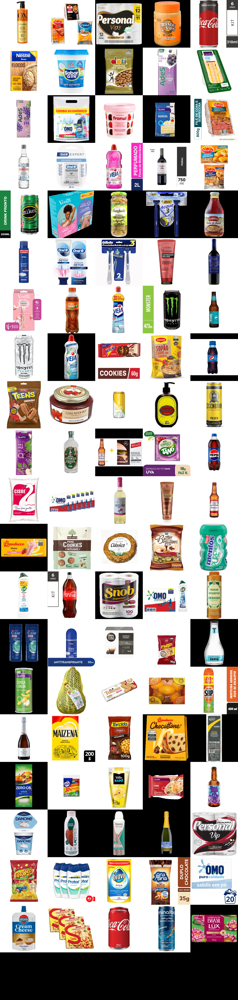

In [180]:
mosaic(best_cart)